In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from nemo.util.plotting import plot_surface

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

%load_ext autoreload
%autoreload 2


Using device: cuda


In [2]:
# Load the same data as surface_fitting.ipynb
dem_path = "../../data/Moon_Map_01_0_rep0.dat"
dem = np.load(dem_path, allow_pickle=True)

print(f"DEM shape: {dem.shape}")
print(f"DEM min: {dem[:,:,2].min()}, max: {dem[:,:,2].max()}")


DEM shape: (180, 180, 4)
DEM min: 0.58948789909482, max: 2.3029180467128754


In [3]:
# Plot the original surface
plot_surface(dem)


In [4]:
def fourier_features(inputs, scale=10, features=256):
    """
    Fourier features mapping from https://arxiv.org/abs/2006.10739
    
    Args:
        inputs: tensor of shape [..., input_dim]
        scale: scale of the random frequencies
        features: number of fourier features
    
    Returns:
        tensor of shape [..., 2*features]
    """
    input_dim = inputs.shape[-1]
    
    # Sample random frequencies
    # B matrix of shape [features, input_dim]
    B = scale * torch.randn(features, input_dim, device=inputs.device)
    
    # Compute 2π * inputs @ B.T
    projected = 2 * np.pi * inputs @ B.T
    
    # Return [sin(projected), cos(projected)]
    return torch.cat([torch.sin(projected), torch.cos(projected)], dim=-1)


In [5]:
class FourierMLP(nn.Module):
    def __init__(self, input_dim=2, hidden_dim=32, num_layers=8, ff_features=256, ff_scale=10):
        super().__init__()
        self.ff_features = ff_features
        self.ff_scale = ff_scale
        
        # Create MLP layers
        layers = []
        
        # First layer takes fourier features as input
        layers.append(nn.Linear(2 * ff_features, hidden_dim))
        layers.append(nn.ReLU())
        
        # Hidden layers
        for _ in range(num_layers - 2):
            layers.append(nn.Linear(hidden_dim, hidden_dim))
            layers.append(nn.ReLU())
        
        # Output layer
        layers.append(nn.Linear(hidden_dim, 1))
        
        self.net = nn.Sequential(*layers)
        
    def forward(self, x):
        # Apply fourier features
        x_ff = fourier_features(x, scale=self.ff_scale, features=self.ff_features)
        
        # Pass through MLP
        return self.net(x_ff).squeeze(-1)


In [6]:
# Prepare data in the same way as surface_fitting.ipynb
dem_reshaped = dem[:, :, :3].reshape(-1, 3)  # Flatten spatial dimensions
dem_tensor = torch.from_numpy(dem_reshaped).float().to(device)

# Split into input (x,y) and target (z) tensors
xy = dem_tensor[:, :2]  # First two columns are x,y coordinates
z = dem_tensor[:, 2]  # Third column is the height value

# Normalize coordinates to [0, 1]
xy_min = xy.min(dim=0)[0]
xy_max = xy.max(dim=0)[0]
xy_normalized = (xy - xy_min) / (xy_max - xy_min)

# Normalize height values
z_mean = z.mean()
z_std = z.std()
z_normalized = (z - z_mean) / z_std

print(f"Data shape: {xy_normalized.shape}")
print(f"Target shape: {z_normalized.shape}")
print(f"Height mean: {z_mean:.2f}, std: {z_std:.2f}")


Data shape: torch.Size([32400, 2])
Target shape: torch.Size([32400])
Height mean: 1.53, std: 0.29


In [7]:
# Create model and optimizer
model = FourierMLP(
    input_dim=2,
    hidden_dim=64,
    num_layers=8,
    ff_features=256,
    ff_scale=10
).to(device)

optimizer = optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.MSELoss()

# Count parameters
num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Model has {num_params:,} parameters")


Model has 57,857 parameters


In [8]:
# Training loop
num_epochs = 5000
print_freq = 500

losses = []

for epoch in range(num_epochs):
    model.train()
    
    # Forward pass
    pred_z = model(xy_normalized)
    loss = criterion(pred_z, z_normalized)
    
    # Backward pass
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    losses.append(loss.item())
    
    if epoch % print_freq == 0:
        print(f"Epoch {epoch:5d}, Loss: {loss.item():.6f}")

print(f"Final loss: {losses[-1]:.6f}")


Epoch     0, Loss: 1.004034
Epoch   500, Loss: 0.997854
Epoch  1000, Loss: 0.997871
Epoch  1500, Loss: 0.998070
Epoch  2000, Loss: 0.998606
Epoch  2500, Loss: 0.998478
Epoch  3000, Loss: 0.998266
Epoch  3500, Loss: 0.998139
Epoch  4000, Loss: 0.998224
Epoch  4500, Loss: 0.997225
Final loss: 0.997688


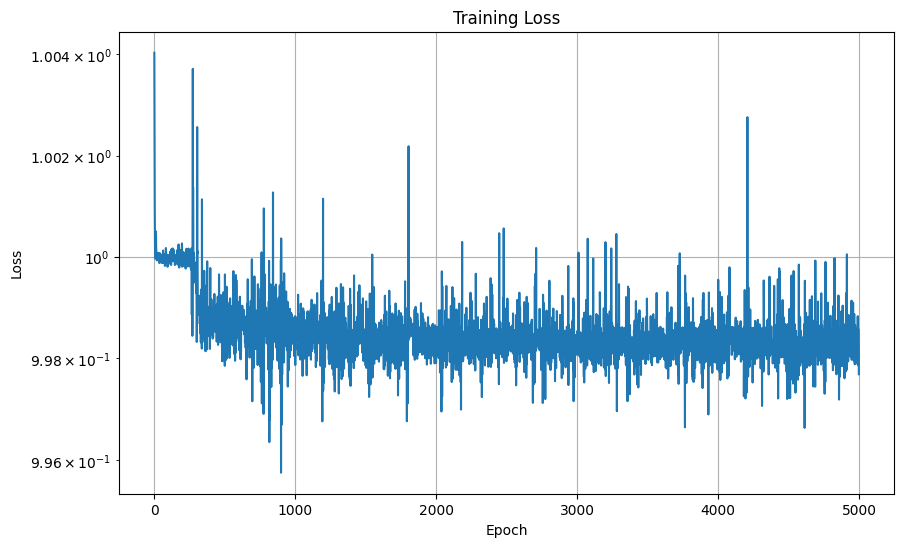

In [9]:
# Plot training loss
plt.figure(figsize=(10, 6))
plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.yscale('log')
plt.grid(True)
plt.show()


In [10]:
# Evaluate model and create reconstructed surface
model.eval()
with torch.no_grad():
    pred_z_normalized = model(xy_normalized)
    
    # Denormalize predictions
    pred_z = pred_z_normalized * z_std + z_mean
    
    # Create reconstructed DEM
    field_dem = dem.copy()
    field_dem[:, :, 2] = pred_z.reshape(180, 180).cpu().numpy()
    
    # Compute reconstruction error
    error = torch.abs(pred_z - z)
    print(f"Reconstruction error - Mean: {error.mean():.3f}, Std: {error.std():.3f}")
    print(f"Reconstruction error - Min: {error.min():.3f}, Max: {error.max():.3f}")
    
    # R² score
    ss_res = torch.sum((z - pred_z) ** 2)
    ss_tot = torch.sum((z - z.mean()) ** 2)
    r2 = 1 - (ss_res / ss_tot)
    print(f"R² score: {r2:.4f}")


Reconstruction error - Mean: 0.237, Std: 0.174
Reconstruction error - Min: 0.000, Max: 0.940
R² score: 0.0015


In [11]:
# Plot the reconstructed surface
plot_surface(field_dem)


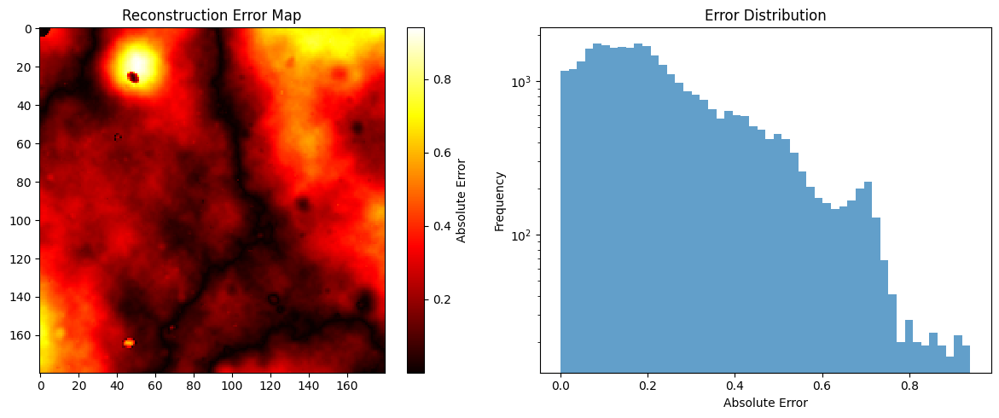

In [12]:
# Plot error map
error_map = error.reshape(180, 180).cpu().numpy()

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(error_map, cmap='hot', interpolation='nearest')
plt.colorbar(label='Absolute Error')
plt.title('Reconstruction Error Map')

plt.subplot(1, 2, 2)
plt.hist(error.cpu().numpy(), bins=50, alpha=0.7)
plt.xlabel('Absolute Error')
plt.ylabel('Frequency')
plt.title('Error Distribution')
plt.yscale('log')

plt.tight_layout()
plt.show()


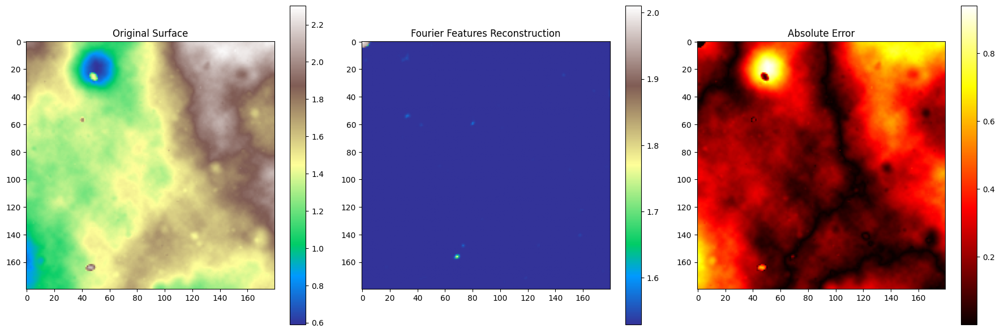

In [13]:
# Side by side comparison
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Original
im1 = axes[0].imshow(dem[:, :, 2], cmap='terrain')
axes[0].set_title('Original Surface')
plt.colorbar(im1, ax=axes[0])

# Reconstructed
im2 = axes[1].imshow(field_dem[:, :, 2], cmap='terrain')
axes[1].set_title('Fourier Features Reconstruction')
plt.colorbar(im2, ax=axes[1])

# Error
im3 = axes[2].imshow(error_map, cmap='hot')
axes[2].set_title('Absolute Error')
plt.colorbar(im3, ax=axes[2])

plt.tight_layout()
plt.show()


Testing scale: 1
  Mean error: 0.230
Testing scale: 5
  Mean error: 0.236
Testing scale: 10
  Mean error: 0.237
Testing scale: 20
  Mean error: 0.237
Testing scale: 50
  Mean error: 0.237


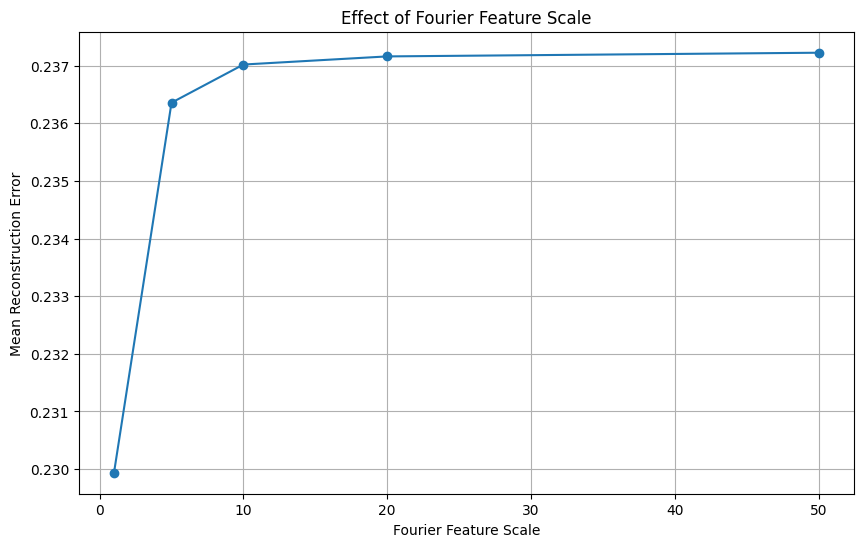

In [14]:
# Ablation study: test different fourier feature scales
scales = [1, 5, 10, 20, 50]
results = []

for scale in scales:
    print(f"Testing scale: {scale}")
    
    # Create model with different scale
    test_model = FourierMLP(
        input_dim=2,
        hidden_dim=64,
        num_layers=8,
        ff_features=256,
        ff_scale=scale
    ).to(device)
    
    test_optimizer = optim.Adam(test_model.parameters(), lr=1e-3)
    
    # Quick training
    for epoch in range(1000):
        test_model.train()
        pred_z = test_model(xy_normalized)
        loss = criterion(pred_z, z_normalized)
        
        test_optimizer.zero_grad()
        loss.backward()
        test_optimizer.step()
    
    # Evaluate
    test_model.eval()
    with torch.no_grad():
        pred_z_normalized = test_model(xy_normalized)
        pred_z = pred_z_normalized * z_std + z_mean
        error = torch.abs(pred_z - z)
        
        results.append({
            'scale': scale,
            'mean_error': error.mean().item(),
            'final_loss': loss.item()
        })
    
    print(f"  Mean error: {error.mean():.3f}")

# Plot ablation results
scales_tested = [r['scale'] for r in results]
errors = [r['mean_error'] for r in results]

plt.figure(figsize=(10, 6))
plt.plot(scales_tested, errors, 'o-')
plt.xlabel('Fourier Feature Scale')
plt.ylabel('Mean Reconstruction Error')
plt.title('Effect of Fourier Feature Scale')
plt.grid(True)
plt.show()
